<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Цели-и-ход-исследования" data-toc-modified-id="Цели-и-ход-исследования-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Цели и ход исследования</a></span></li><li><span><a href="#Подготовка" data-toc-modified-id="Подготовка-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Подготовка</a></span></li><li><span><a href="#Анализ" data-toc-modified-id="Анализ-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Анализ</a></span></li><li><span><a href="#Обучение" data-toc-modified-id="Обучение-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Обучение</a></span><ul class="toc-item"><li><span><a href="#Подготовка-признаков" data-toc-modified-id="Подготовка-признаков-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Подготовка признаков</a></span></li><li><span><a href="#Линейные-модели" data-toc-modified-id="Линейные-модели-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Линейные модели</a></span></li><li><span><a href="#CatBoostRegressor" data-toc-modified-id="CatBoostRegressor-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>CatBoostRegressor</a></span></li><li><span><a href="#LGBMRegressor" data-toc-modified-id="LGBMRegressor-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>LGBMRegressor</a></span></li><li><span><a href="#Результаты" data-toc-modified-id="Результаты-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Результаты</a></span></li></ul></li><li><span><a href="#Тестирование" data-toc-modified-id="Тестирование-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Тестирование</a></span></li><li><span><a href="#Общий-вывод" data-toc-modified-id="Общий-вывод-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Общий вывод</a></span></li></ul></div>

#  Прогнозирование заказов такси

Компания, предоставляющая услуги такси, собрала исторические данные о заказах такси в аэропортах. Чтобы привлекать больше водителей в период пиковой нагрузки, нужно спрогнозировать количество заказов такси на следующий час. Постройте модель для такого предсказания.

Значение метрики *RMSE* на тестовой выборке должно быть не больше 48.

Вам нужно:

1. Загрузить данные и выполнить их ресемплирование по одному часу.
2. Проанализировать данные.
3. Обучить разные модели с различными гиперпараметрами. Сделать тестовую выборку размером 10% от исходных данных.
4. Проверить данные на тестовой выборке и сделать выводы.


Данные лежат в файле `taxi.csv`. Количество заказов находится в столбце `num_orders` (от англ. *number of orders*, «число заказов»).

## Цели и ход исследования

Компания, предоставляющая услуги такси, собрала исторические данные о заказах такси в аэропортах. Чтобы привлекать больше водителей в период пиковой нагрузки, нужно спрогнозировать количество заказов такси на следующий час.

В данном исследовании мы проанализируем исторические данные о заказах такси в аэропортах. 

**Цель исследования**:
Построить модель, которая прогнозирует количество заказов такси на следующий час. 

**Метрика**:
RMSE

**Ход исследования**:
- Подготовка данных
- Анализ данных
- Обучение моделей
- Тестирование модели

## Подготовка

In [1]:
!pip install optuna

In [2]:
# Импортируем библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.seasonal import seasonal_decompose

from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.metrics import mean_squared_error
from sklearn.dummy import DummyRegressor

import optuna

import lightgbm as lgb

from catboost import CatBoostRegressor, Pool

import warnings; warnings.filterwarnings('ignore')

In [3]:
# Открываем файл
try:
    df = pd.read_csv('/datasets/taxi.csv', index_col=[0], parse_dates=[0])
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/taxi.csv', index_col=[0], parse_dates=[0])    

In [4]:
# Изучим информацию
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 26496 entries, 2018-03-01 00:00:00 to 2018-08-31 23:50:00
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   num_orders  26496 non-null  int64
dtypes: int64(1)
memory usage: 414.0 KB


In [5]:
df.head(10)

,num_orders
datetime,
2018-03-01 00:00:00,9
2018-03-01 00:10:00,14
2018-03-01 00:20:00,28
2018-03-01 00:30:00,20
2018-03-01 00:40:00,32
2018-03-01 00:50:00,21
2018-03-01 01:00:00,7
2018-03-01 01:10:00,5
2018-03-01 01:20:00,17


In [6]:
# Проверим расположены ли даты и время в хронологическом ли порядке  
df.index.is_monotonic

True

In [7]:
# Ресемплируем данные по одному часу
df = df.resample('1H').sum()

In [8]:
df.head(10)

,num_orders
datetime,
2018-03-01 00:00:00,124
2018-03-01 01:00:00,85
2018-03-01 02:00:00,71
2018-03-01 03:00:00,66
2018-03-01 04:00:00,43
2018-03-01 05:00:00,6
2018-03-01 06:00:00,12
2018-03-01 07:00:00,15
2018-03-01 08:00:00,34


In [9]:
# Проверим на наличие пропусков
df.isna().sum()

num_orders    0
dtype: int64

**Вывод**

В исходом датасете **26496** строк и **2** столбцa. 

При чтении файла мы сделали колонку `datetime` индексом для удобства работы с временным рядом.

Данные столбца `num_orders`, который является целевым признаком, имеют тип `int64` и относятся к количественным, значит в ходе машинного обучения будет решатся задача регрессии.

В данных нет пропусков.

## Анализ

In [10]:
# Посмотрим, где начинается временнной ряд
df.index.min()

Timestamp('2018-03-01 00:00:00', freq='H')

In [11]:
# и где заканчивается 
df.index.max()

Timestamp('2018-08-31 23:00:00', freq='H')

**Временной ряд охватывает период с начала марта по конец августа 2018 года**.

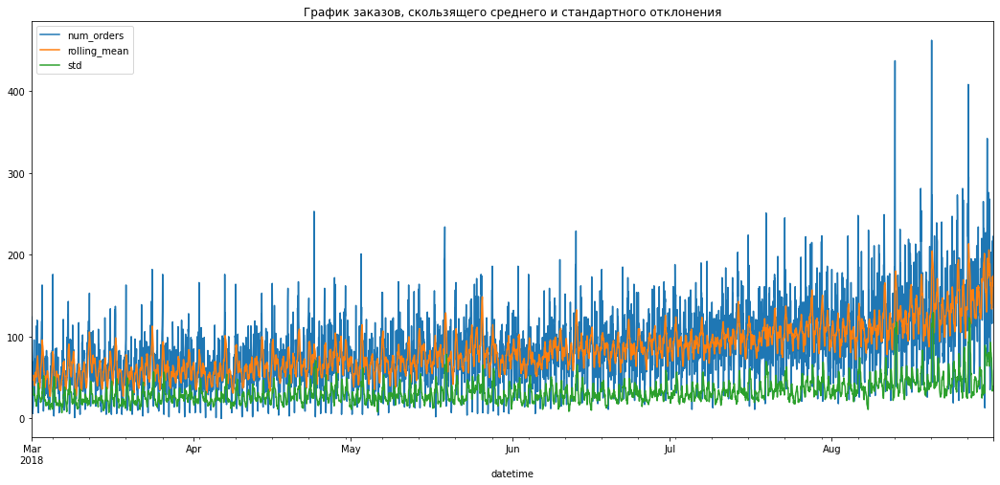

In [12]:
# Построим график заказов, скользящего среднего и стандартного отклонения
df_a = df.copy()
df_a['rolling_mean'] = df_a['num_orders'].rolling(10).mean()
df_a['std'] = df_a['num_orders'].rolling(10).std()
df_a.plot(figsize = (18,8), title = 'График заказов, скользящего среднего и стандартного отклонения');

**Перед нами нестационарный временной ряд, среднее значение и стандартное отклонение которого со временем меняются.**

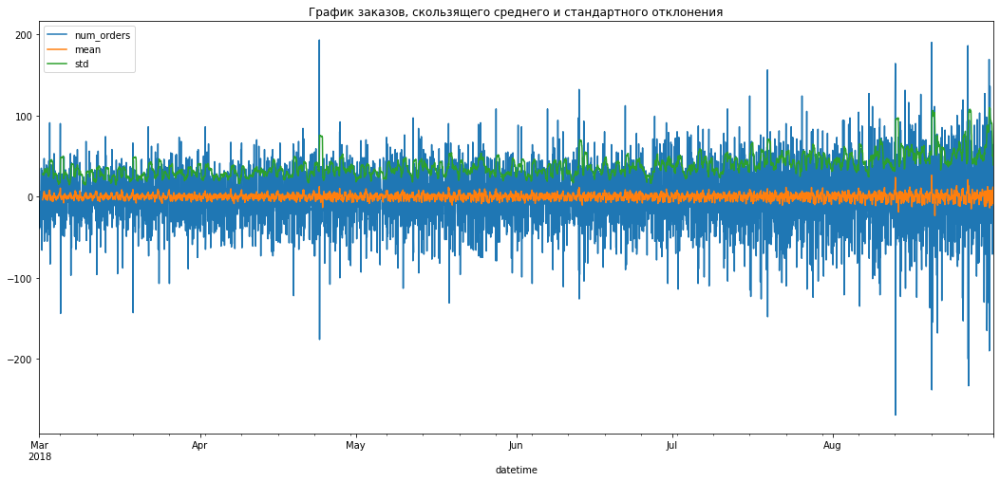

In [13]:
# Построим график разностей временного ряда
df_b = df.copy()
df_b = df_b - df_b.shift()
df_b['mean'] = df_b['num_orders'].rolling(15).mean()
df_b['std'] = df_b['num_orders'].rolling(15).std()
df_b.plot(figsize = (18,8), title = 'График заказов, скользящего среднего и стандартного отклонения');

In [14]:
# Разложим временной ряд тренд, сезонность и остаток 
decomposed = seasonal_decompose(df)

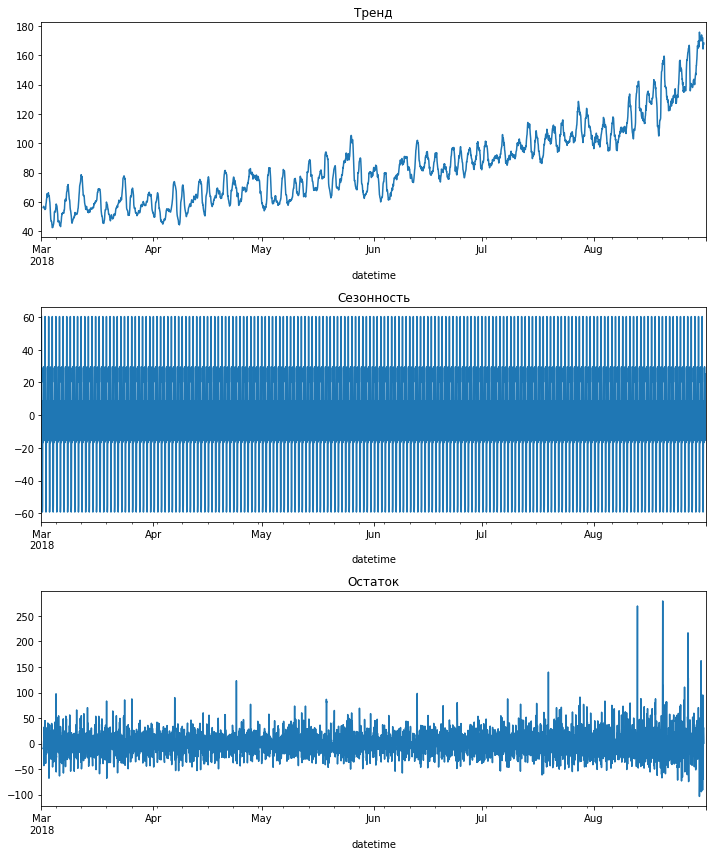

In [15]:
# Построим графики трех компонентов

plt.figure(figsize=(10, 12))

plt.subplot(311)
decomposed.trend.plot(ax=plt.gca())
plt.title('Тренд')

plt.subplot(312)
decomposed.seasonal.plot(ax=plt.gca()) 
plt.title('Сезонность')

plt.subplot(313)
decomposed.resid.plot(ax=plt.gca()) 
plt.title('Остаток')

plt.tight_layout()

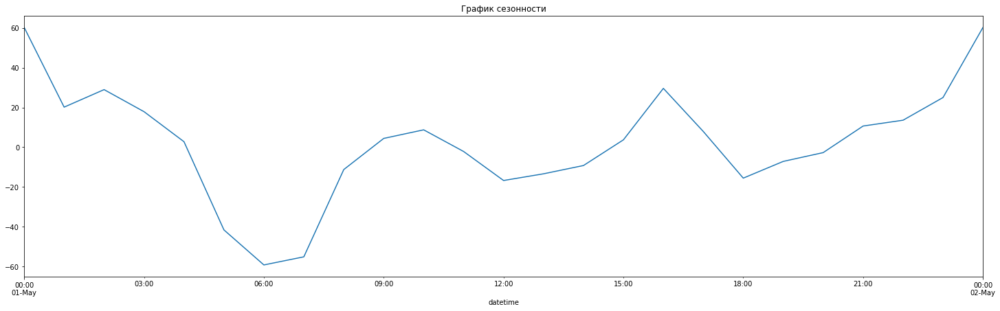

In [16]:
# Исследуем сезонность на периоде в один день
decomposed.seasonal['2018-05-01 00:00:00':'2018-05-02 00:00:00'].plot(figsize = (25,7), 
                                                                      title = 'График сезонности');

**Вывод**

 Мы проанализировали данные, которые охватывают период с марта по август 2018 года.
 
 Обнаружили, что временной ряд является нестационарным. 
 
 Тренд восходящий.
 
 Сезонность прослеживается в течение дня. Пик заказов приходится на ночное время. Максимум - на полночь. Минимум - на 6 утра. Затем число заказов растет в начале рабочего дня, немного снижается в обед. Еще один локальный пик приходится на 16:00, спад на 18:00.

## Обучение

### Подготовка признаков

In [18]:
# Создадим признаки
df_c = df.copy()
df_c['dayofweek'] = df_c.index.dayofweek
df_c['hour'] = df_c.index.hour
df_c['lag_1'] = df_c['num_orders'].shift(1)
df_c['rolling_mean'] = df_c['num_orders'].shift().rolling(24).mean()                

In [19]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4416 entries, 2018-03-01 00:00:00 to 2018-08-31 23:00:00
Freq: H
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   num_orders    4416 non-null   int64  
 1   dayofweek     4416 non-null   int64  
 2   hour          4416 non-null   int64  
 3   lag_1         4415 non-null   float64
 4   rolling_mean  4392 non-null   float64
dtypes: float64(2), int64(3)
memory usage: 207.0 KB


In [20]:
df_c.head()

,num_orders,dayofweek,hour,lag_1,rolling_mean
datetime,,,,,
2018-03-01 00:00:00,124,3,0,NaN,NaN
2018-03-01 01:00:00,85,3,1,124.0,NaN
2018-03-01 02:00:00,71,3,2,85.0,NaN
2018-03-01 03:00:00,66,3,3,71.0,NaN
2018-03-01 04:00:00,43,3,4,66.0,NaN


In [21]:
# Разделим данные на выборки
train, test = train_test_split(df_c, shuffle=False, test_size=0.1)
train = train.dropna()

In [22]:
train.shape

(3950, 5)

In [23]:
test.shape

(442, 5)

In [24]:
print(train.index.min(), train.index.max())
print(test.index.min(), test.index.max())

2018-03-02 00:00:00 2018-08-13 13:00:00
2018-08-13 14:00:00 2018-08-31 23:00:00


In [25]:
# Выделим признаки и целевой признак
features_train = train.drop('num_orders', axis = 1)
target_train =  train['num_orders']

features_test = test.drop('num_orders', axis = 1)
target_test = test['num_orders']

### Линейные модели

In [67]:
# Обучим линейную регрессию, проверим качество модели на кросс-валидации с помощью cross_val_score
lenreg = LinearRegression()

tscv = TimeSeriesSplit(n_splits=8)

lenreg_score = abs(cross_val_score(lenreg, 
                                   features_train, 
                                   target_train, 
                                   cv=tscv,
                                   scoring = 'neg_root_mean_squared_error').sum()/5)
lenreg.fit(features_train, target_train)

LinearRegression()

**Для временного ряда мы используем кросс-валидатор TimeSeriesSplit.** 

**Исходя из количества данных и горизонта предсказания, берем трехнедельный период для каждого сплита:**      

**3964 : 24 : 21 = 7.86507938** 

**Таким образом количетво сплитов равно 8.**

In [68]:
lenreg_score

50.18682172324004

In [32]:
# Обучим модель ElasticNet, проверим качество модели на кросс-валидации с помощью cross_val_score
elastic = ElasticNet()     

tscv = TimeSeriesSplit(n_splits=12)

param_grid = {'alpha':  np.linspace(0.1, 1.0, 10),
              'l1_ratio': np.linspace(0.1, 1.0, 10)}

el = GridSearchCV(elastic,
                  cv=tscv,
                  param_grid = param_grid, 
                  scoring = 'neg_root_mean_squared_error', 
                  n_jobs = -1,
                  verbose = True)

el.fit(features_train, target_train)  

Fitting 12 folds for each of 100 candidates, totalling 1200 fits


GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=12, test_size=None),
             estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
                         'l1_ratio': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])},
             scoring='neg_root_mean_squared_error', verbose=True)

In [33]:
el.best_params_

{'alpha': 1.0, 'l1_ratio': 0.1}

In [34]:
np.abs(el.best_score_)

31.05040905209798

### CatBoostRegressor

In [50]:
# Обучим CatBoostRegressor с гиперпараметрами по умолчанию
cb = CatBoostRegressor(random_seed = 12345, verbose = False)

tscv = TimeSeriesSplit(n_splits=12)

cb_score = abs(cross_val_score(cb, 
                               features_train, 
                               target_train, 
                               cv=tscv,
                               scoring = 'neg_root_mean_squared_error').sum()/5)
cb.fit(features_train, target_train)

In [52]:
cb_score

57.197779191709245

In [51]:
cb.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'RMSE',
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'bayesian_matrix_reg': 0.10000000149011612,
 'force_unit_auto_pair_weights': False,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': True,
 'model_size_reg': 0.5,
 'pool_metainfo_options': {'tags': {}},
 'subsample': 0.800000011920929,
 'use_best_model': False,
 'random_seed': 12345,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_data_in_leaf': 1,
 'loss_function': 'RMSE',
 'learning_rate': 0.05086800083518028,
 'score_function': 'Cosine',
 'task_t

In [41]:
# Подберем гиперпараметры для CatBoostRegressor с помощью метода grid_search

%time

cb = CatBoostRegressor(random_seed = 12345)

tscv = TimeSeriesSplit(n_splits=12)

grid = {'learning_rate': [0.01, 0.03, 0.05, 0.07, 0.1],
        'depth': [2, 4, 6, 8, 10],
        'iterations': [1000, 1500, 2000]}

rs_result = cb.grid_search(grid, features_train, target_train, cv=tscv, plot = True, verbose = False)

CPU times: user 2 µs, sys: 2 µs, total: 4 µs
Wall time: 6.2 µs


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 78.5306480	test: 113.9726259	best: 113.9726259 (0)	total: 541us	remaining: 541ms
1:	learn: 77.8818167	test: 113.2678030	best: 113.2678030 (1)	total: 1.19ms	remaining: 593ms
2:	learn: 77.2335027	test: 112.5849522	best: 112.5849522 (2)	total: 1.59ms	remaining: 529ms
3:	learn: 76.6120414	test: 111.9458802	best: 111.9458802 (3)	total: 1.94ms	remaining: 482ms
4:	learn: 75.9826041	test: 111.2238943	best: 111.2238943 (4)	total: 2.32ms	remaining: 461ms
5:	learn: 75.3591380	test: 110.5697117	best: 110.5697117 (5)	total: 2.64ms	remaining: 438ms
6:	learn: 74.7270157	test: 109.8976785	best: 109.8976785 (6)	total: 2.97ms	remaining: 421ms
7:	learn: 74.1012192	test: 109.1437887	best: 109.1437887 (7)	total: 3.29ms	remaining: 408ms
8:	learn: 73.5000158	test: 108.5103320	best: 108.5103320 (8)	total: 3.63ms	remaining: 400ms
9:	learn: 72.8854108	test: 107.8215334	best: 107.8215334 (9)	total: 3.97ms	remaining: 393ms
10:	learn: 72.2967325	test: 107.1789118	best: 107.1789118 (10)	total: 4.3ms	remai

In [44]:
cb.get_params()

{'loss_function': 'RMSE',
 'random_seed': 12345,
 'depth': 4,
 'iterations': 2000,
 'learning_rate': 0.01}

In [45]:
cb.get_best_score()

{'learn': {'RMSE': 20.57449779082947}}

### LGBMRegressor

In [53]:
# Обучим LGBMRegressor с гиперпараметрами по умолчанию, 
# проверим качество модели на кросс-валидации с помощью cross_val_score

%time

lgbr = lgb.LGBMRegressor(num_leaves=31,  random_seed = 12345)

tscv = TimeSeriesSplit(n_splits=12)

lgbr_score = abs(cross_val_score(lgbr, 
                                 features_train, 
                                 target_train, 
                                 cv=tscv,
                                 scoring = 'neg_root_mean_squared_error').sum()/5)

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 5.25 µs


In [54]:
lgbr.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'random_seed': 12345}

In [55]:
lgbr_score

57.01941858852966

In [56]:
# Подберем гиперпараметры для LGBMRegressor с помощью optuna

%time

def objective(trial):
    
    learning_rate = trial.suggest_float('learning_rate',  low=0.01, high=0.1, step=0.02)
    n_estimators = trial.suggest_int('n_estimators', 100, 300, 100)
    
    model = lgb.LGBMRegressor(num_leaves=31,  random_seed = 12345)
    
    tscv = TimeSeriesSplit(n_splits=12)
    
    sc = cross_val_score(model, 
                         features_train, 
                         target_train, 
                         n_jobs = -1, 
                         cv=tscv, 
                         scoring = 'neg_root_mean_squared_error')
    
    return np.abs(sc).mean()

study = optuna.create_study(direction ='minimize')
study.optimize(objective, n_trials = 1, show_progress_bar = True)

lgbm_best_learning_rate = study.best_trial.params.get('learning_rate')
lgbm_best_n_estimators = study.best_trial.params.get('n_estimators')
lgbm_best_score = study.best_value

lgbm = lgb.LGBMRegressor(num_leaves=31, 
                         learning_rate = lgbm_best_learning_rate, 
                         n_estimators = lgbm_best_n_estimators,
                         random_seed = 12345)


[I 2023-03-14 08:25:30,026] A new study created in memory with name: no-name-80cff0c5-78da-4860-a89d-a528fc111ca5


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs


  0%|          | 0/1 [00:00<?, ?it/s]

[I 2023-03-14 08:25:37,659] Trial 0 finished with value: 23.758091078554028 and parameters: {'learning_rate': 0.03, 'n_estimators': 200}. Best is trial 0 with value: 23.758091078554028.


In [57]:
lgbm_best_learning_rate

0.03

In [58]:
lgbm_best_n_estimators

200

In [59]:
lgbm_best_score

23.758091078554028

In [70]:
lgbm.fit(features_train, target_train)

LGBMRegressor(learning_rate=0.03, n_estimators=200, random_seed=12345)

### Результаты

In [60]:
results = pd.DataFrame(index = [['linear', 'elastic', 'catboost', 'lightGBM']],
                       data = [50.19, 31.05, 20.57, 23.76],
                       columns = ['RMSE'])

In [63]:
results.sort_values(by = 'RMSE')

,RMSE
catboost,20.57
lightGBM,23.76
elastic,31.05
linear,50.19


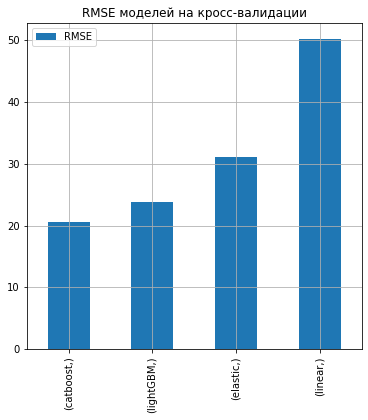

In [65]:
results.sort_values(by = 'RMSE').plot(kind = 'bar',
                                      grid = True,
                                      figsize = (6, 6),
                                      title = 'RMSE моделей на кросс-валидации');

In [122]:
# Создадим таблицу реальных и предсказанных значений целевого признака
predictions_table = pd.DataFrame()
predictions_table['target'] = target_train
predictions_table = predictions_table.reset_index()
predictions_table['linear'] = pd.Series(lenreg.predict(features_train))
predictions_table['elastic'] = pd.Series(el.predict(features_train))
predictions_table['catboost'] = pd.Series(cb.predict(features_train))
predictions_table['lightGBM'] = pd.Series(lgbm.predict(features_train))
predictions_table = predictions_table.set_index('datetime')

In [124]:
predictions_table

,target,linear,elastic,catboost,lightGBM
datetime,,,,,
2018-03-02 00:00:00,90,56.095430,56.178718,99.558409,88.319050
2018-03-02 01:00:00,120,70.208432,70.281794,80.676742,77.247528
2018-03-02 02:00:00,75,84.765226,84.825359,65.013734,59.173784
2018-03-02 03:00:00,64,64.709154,64.768579,61.209209,60.388314
2018-03-02 04:00:00,20,59.951720,60.005805,38.937860,40.338206
...,...,...,...,...,...
2018-08-13 09:00:00,137,109.582356,109.612728,136.854238,125.775960
2018-08-13 10:00:00,156,131.276332,131.291461,150.101098,140.592146
2018-08-13 11:00:00,144,141.100035,141.102857,128.855268,113.215267


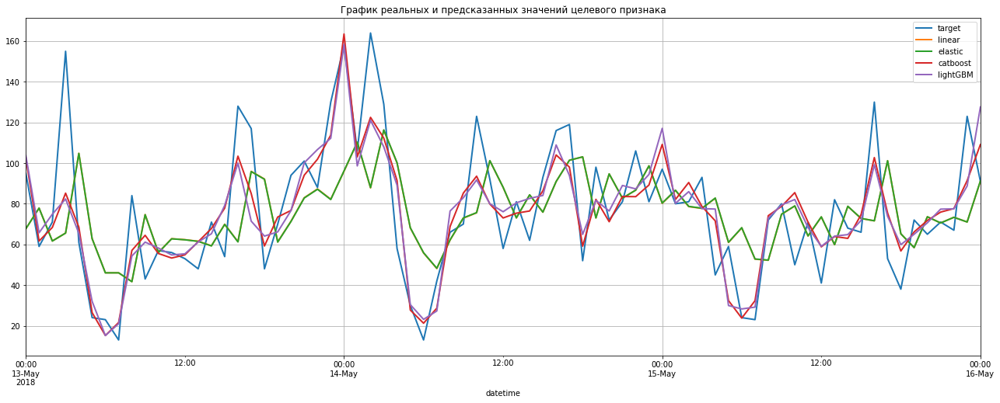

In [142]:
# Построим график реальных и предсказанных значений целевого признака в масштабе двух дней
predictions_table['2018-05-13 00:00:00':'2018-05-16 00:00:00']\
.plot(figsize=(22,8), 
      grid=True,
      linewidth=2,
      title='График реальных и предсказанных значений целевого признака');

Мы видим отклонения предсказаний всех моделей от реальных данных в конкретные часы.

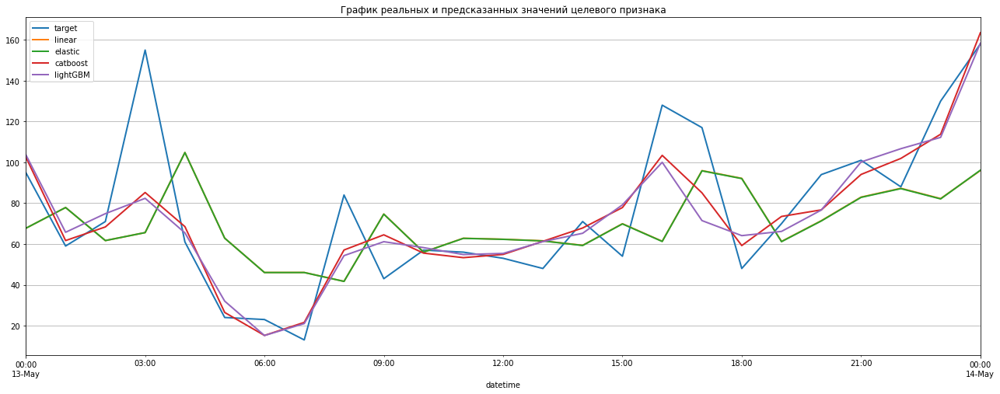

In [150]:
# Посмотрим на период в один день
predictions_table['2018-05-13 00:00:00':'2018-05-14 00:00:00']\
.plot(figsize = (22,8), 
      grid=True,
      linewidth=2,
      title = 'График реальных и предсказанных значений целевого признака');

Мы видим, что все модели плохо предсказывают ночной пик в 3:00 и дневной - в 16:00, а также менее заметный пик в начале рабочео дня.

При этом модель `ElasticNet` запаздывает с предсказаниями пиков. А регрессоры `CatBoost`и `LightGBM` дают очень сглаженные предсказания.

## Тестирование

In [144]:
# Протестируем лучшую модель 
predictions_test = cb.predict(features_test)
test_result = mean_squared_error(target_test, predictions_test)**0.5

In [145]:
test_result

43.70031498719785

In [146]:
# Проверим модели на адекватность с помощью DummyRegressor со стратегией 'mean'

dummy_model = DummyRegressor(strategy = 'mean')

dummy_model.fit(features_train, target_train)

predictions_dummy =  dummy_model.predict(features_test)

dummy_result = mean_squared_error(target_test, predictions_dummy)**0.5

In [147]:
dummy_result

84.6499381993622

In [148]:
# Проверим модели на адекватность с помощью DummyRegressor со стратегией 'median'

dummy_model = DummyRegressor(strategy = 'median')

dummy_model.fit(features_train, target_train)

predictions_dummy =  dummy_model.predict(features_test)

dummy_result = mean_squared_error(target_test, predictions_dummy)**0.5

In [149]:
dummy_result

87.15277582981295

## Общий вывод

Мы проанализировали исторические данные о заказах такси в аэропортах.

Данные охватывают период с марта по август 2018 года.
 
Временной ряд является нестационарным. 
 
Тренд восходящий.
 
Сезонность прослеживается в течение дня. Пик заказов приходится на полночь. Минимум - на 6 утра. 

Мы добавили в данные:

1. Календарные  признаки: 
 - день недели
 - час
 
 
2. Отстающие значения с лагом 1 


3. Скользящее среднее с шириной окна 24

Мы обучили модели `LinearRegression`, `ElasticNet`, `CatBoostRegressor`, `LGBMRegressor`.

Лучший результат по метрике RMSE и по времени обучения показала модель `CatBoostRegressor`.

Мы протестировали лучшую модель на тестовой выборке и проверили на адекватность с помощью `DummyRegressor`. 

На тестовой выборке модель `CatBoostRegressor` с параметрами depth - 4, iterations - 2000,
learning_rate - 0.01 показала RMSE **43.7**.